<a href="https://colab.research.google.com/github/DiploDatos/AprendizajeProfundo/blob/add_2024_content/5_Optimizacion_de_Hiperparametros_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Optimización de Hiperparámetros

En esta notebook utilizaremos el conjunto de datos CIFAR-10, y trataremos de construir la mejor red neuronal para resolver esa tarea de clasificación, empleando el algoritmo de optimización de hiperparámetros.

## Overfitting / Underfitting

Los modelos de aprendizaje automático tienen dos problemas comunes: puede suceder que sobreajusten a los datos de entrenamiento (overfitting) y no generalicen a datos no vistos o, por el contrario, que no tengan la capacidad de aprender el conjunto de entrenamiento(underfitting).

Varios factores pueden provocar un sobreajuste: un conjunto de datos pequeño, un modelo con demasiada capacidad o valores de ponderación elevados.

### Solutions for Underfitting and Overfitting

|UNDERFITTING|OVERFITTING||
|:--:|:--:|--|
|**POCA CAPACIDAD PARA APRENDER**|**DEMASIADA CAPACIDAD Y RAPIDEZ DE APRENDIZAJE**||
|*Aumentar observaciones*. Es posible que no tenga suficientes datos para que los patrones existentes se conviertan en señales sólidas.|Aumentar el tamaño del conjunto de datos (data augmentation), introduciendo variaciones y aumentar la diversidad.||
|*Aumentar features*. En ocasiones, nuestro modelo no se ajusta a la perfección debido a que los elementos de features son insuficientes.|| |\
|*Aumentar el número de canales y/o la profundidad de la red*, mejorando la capacidad del modelo para detectar patrones.|*Reducir el número y/o tamaño de capas ocultas*, regularizando la capacidad del modelo.||
|Batch size pequeño: Puede evitar que el modelo se estanque en mínimos locales.|Ajustar el tamaño del batch (batch size), un tamaño de batch mayor puede mejorar la estabilidad del entrenamiento.||
|*Reducir regularización* en el modelo (eliminar o reducir weight decay o dropout).|Aplicar regularización (weight decay), penaliza los pesos grandes y promueve modelos más simples.| |
|Disminuir la tasa de aprendizaje (learning rate), si es muy alta.|Ajustar dinámicamente la tasa de aprendizaje a lo largo del entrenamiento.||
|Cambiar a un optimizador más sofisticado (De SGD a Adam). Adam puede ajustarse mejor a las características de datos más complejos.|Emplear la parada temprana para actuar a medida que la pérdida de validación se estabiliza.||
||||
|**FALTA DE APRENDIZAJE**|**PEQUEÑO SOBREAJUSTE**||
|Aumentar la cantidad de épocas hasta que la curva de validación haya dejado de mejorar.|Emplear la parada temprana para detener el entrenamiento una vez que la curva de validación haya dejado de mejorar.||
|Emplear parada temprana para identificar cuántas épocas se requieren.| ||
|Aumentar la tasa de aprendizaje y usar un callback para auto ajuste, alcanzará más rápido un mínimo en la curva de validación y acelerará el recorrido del gradiente.| ||
----

Para diagnosticar estos problemas es necesario examinar las curvas de aprendizaje del modelo en el conjunto de entrenamiento y en un conjunto de datos no vistos (validación).

<img src="https://drive.google.com/uc?export=view&id=13DhPzvXZNZyTqY2g3E9zCla84UnboNOY" width="400" alt="Underfitting 1" title="Underfitting 2"/>
<img src="https://drive.google.com/uc?export=view&id=1NREQKPT5W6WP2B6LUyOOoWy-1uOWlOvV" width="400" alt="Underfitting 2" title="Underfitting 2"/>
<img src="https://drive.google.com/uc?export=view&id=1WW9HE7XBtyh6526VImzDYp3I7LXH8L-u" width="400" alt="Overfitting 2" title="Overfitting 1"/>
<img src="https://drive.google.com/uc?export=view&id=1JJEycvK267QpBP7qDoe8GaCpUoRJaW8I" width="400" alt="Overfitting 2" title="Overfitting 2"/>


<img src='https://storage.googleapis.com/kaggle-media/learn/images/eP0gppr.png' width='400'></img>
<img src='https://truera.com/wp-content/uploads/2022/09/Accuracy-Curve-1.png' width='400'></img>

In [ ]:
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

import torch
from torch.utils.data import TensorDataset, DataLoader
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F

from torchvision import datasets
from torchvision.utils import make_grid
from torchvision.transforms import ToTensor, transforms

from sklearn import metrics
from tqdm.notebook import tqdm

seed = 28
torch.manual_seed(seed)
# torch.cuda.manual_seed(seed)

In [ ]:
torch.__version__

'2.4.1+cu121'

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

## Carga y Preparación de los datos del CIFAR10

- El conjunto de datos a utilizar es el **[CIFAR-10](https://www.cs.toronto.edu/~kriz/cifar.html)**.
- Es un conjunto estándar para hacer **reconocimiento de imágenes**.
- Buscamos entrenar un clasificador que reconozca qué objeto está siendo mostrado en la imagen a partir de un conjunto fijo de categorías posibles.
- El CIFAR-10 está compuesto por imágenes a color de 32x32 píxeles representadas como *tensores* de 32x32x3, donde la tercera dimensión representa los canales RGB (colores rojo, verde, azul). Los valores representan la intensidad de cada color en dicho pixel.
- La salida son **10 clases**: avión, auto, pájaro, gato, siervo, perro, sapo, caballo, bote, camión. Hay 6000 imágenes de cada clase.
- El **conjunto de entrenamiento** posee 50000 imágenes y el **conjunto de test** 10000 imágenes.

----
**Observaciones:**

Debemos dividir nuestro conjunto de datos en tres subconjuntos: entrenamiento, validación y prueba.
- Durante el entrenamiento, ajustaremos los parámetros del modelo (nuestros pesos y sesgos).
- Durante la validación, ajustaremos los hiperparámetros, como la tasa de aprendizaje y el impulso.
- El conjunto de datos de prueba (test) se usa solo una vez para calcular las métricas finales.

Nos enfocaremos en evaluar las siguientes métricas en PyTorch:
- pérdida (loss) durante el entrenamiento y la validación, y
- la precisión (accuracy) durante el entrenamiento y la validación.

In [ ]:
def data_preparation(BATCH_SIZE, transform):

    # Download and load the training data
    trainset = datasets.CIFAR10(root='./data', train=True,
                                download=True, transform=transform)
    trainloader = DataLoader(trainset, batch_size=BATCH_SIZE,
                                shuffle=True, num_workers=2)

    # Download and load the test data
    testset = datasets.CIFAR10(root='./data', train=False,
                                download=True, transform=transform)
    testloader = DataLoader(testset, batch_size=BATCH_SIZE,
                            shuffle=False, num_workers=2)

    return trainset, trainloader, testset, testloader

In [ ]:
BATCH_SIZE = 64

transform = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ]
    )

trainset, trainloader, testset, testloader = data_preparation(BATCH_SIZE, transform)
CIFAR_CLASSES = trainset.classes
print(f'Classes: {CIFAR_CLASSES}')

100%|██████████| 170498071/170498071 [00:02<00:00, 81033034.27it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified
Classes: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


images.shape: torch.Size([64, 3, 32, 32])


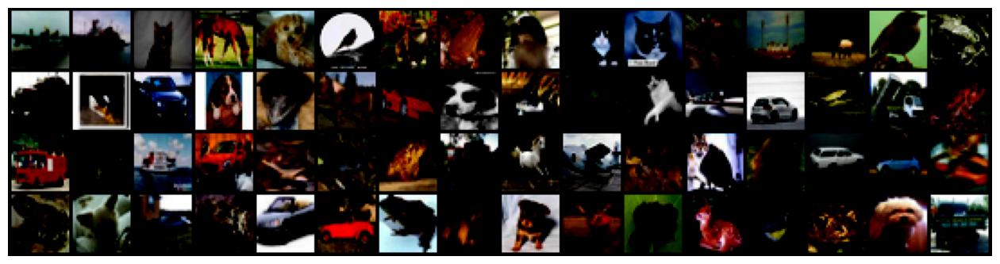

In [ ]:
# @title
for images, _ in trainloader:
    print('images.shape:', images.shape)
    plt.figure(figsize=(16,8))
    plt.axis('off')
    plt.imshow(make_grid(images, nrow=16).permute((1, 2, 0)))
    break

## Repasando los Pasos del Entrenamiento de una Red Neuronal

Antes del ciclo de entrenamiento:
1. Preparar los datos y el cargador de datos (data loader)
2. Definir la arquitectura de la red neuronal
3. Definir el optimizador y la función de coste

Dentro del ciclo de entrenamiento:
4. Realizar un pase hacia adelante (Forward Pass)
5. Calcular el valor de la función de pérdida
5. Calcular los gradientes (Backward Pass)
6. Actualización de los pesos en base al gradiente (Optimizador)
        weights = weights - learning_rate * gradient

        step size = learning_rate * gradient

## Funciones de Entrenamiento y Validación
**Definiremos las funciones de entrenamiento y validación por separado para ayudar a la legibilidad de los experimentos.**

**Función de entrenamiento**

La función `train` recibe como parámetros el modelo (definido por la estructura de la red neuronal), el optimizador, la función de pérdida, el cragador de datos de entrenamiento (`trainloader`), el número de épocas a entrenar (`n_epochs`), y el parámetro opcional `use_tqdm` que indica si se desea mostrar el avance del proceso de entrenamiento mediante barras de progreso utilizando la librería tqdm.

**Función de validación**

A la hora de evaluar un modelo sistemáticamente, debemos elegir una métrica principal y, opcionalmente, varias secundarias. En el caso del dataset cifar, en donde las clases están balanceadas adecuadamente, utilizaremos el [**accuracy**](https://scikit-learn.org/stable/modules/model_evaluation.html#accuracy-score:~:text=3.3.2.2.%20Accuracy%20score%C2%B6) como métrica principal y el [**f1-score**](https://scikit-learn.org/stable/modules/model_evaluation.html#precision-recall-f-measure-metrics:~:text=3.3.2.9.%20Precision%2C%20recall%20and%20F%2Dmeasures) como métrica secundaria.


In [ ]:
def train_epoch(model, trainloader, loss_function, optimizer, epoch, use_tqdm=True):

    model.to(device)
    model.train()  # Activate training mode

    # Initialize the acumulated loss of the current epoch
    y_true, y_pred = [], []
    step_training_loss = 0
    pbar = tqdm(trainloader) if use_tqdm else trainloader
    for step, (inputs, labels) in enumerate(pbar, 1):
        # Tensors to gpu (if necessary)
        inputs, labels = inputs.to(device), labels.to(device)

        # Zero the gradients to zero
        optimizer.zero_grad()

        # Run a forward pass
        features = inputs.view(inputs.shape[0], -1)
        predicted_outputs = model(features)

        # Compute loss
        loss = loss_function(predicted_outputs, labels)
        # Accumulate the average loss of the mini-batch
        step_training_loss += loss.item()

        # Backpropagation
        # Compute gradients
        loss.backward()

        # Update the parameters
        optimizer.step()

        # Compute accuracy
        _, predicted = torch.max(predicted_outputs , 1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())

        # Print statistics each 50 mini-batches
        if use_tqdm and step % 50 == 0:
            # Show number of epoch, step and average loss
            pbar.set_description(f"[{epoch}, {step}] Train average loss: {step_training_loss / step:.4g}")

    # Epoch average loss and accuracy
    epoch_training_loss = round(step_training_loss / len(trainloader), 4)
    epoch_training_accuracy = metrics.accuracy_score(y_true, y_pred)

    return epoch_training_loss, epoch_training_accuracy


def validation(model, dataloader, prefix='test_', use_tqdm=True):
    model.eval()  # Activate evaluation mode
    y_true, y_pred = [], []
    validation_loss, running_accuracy = 0, 0
    # Don't calculate gradient speed up the forward pass
    with torch.no_grad():
        pbar = tqdm(dataloader) if use_tqdm else dataloader
        for step, (inputs, labels) in enumerate(pbar, 1):
            inputs, labels = inputs.to(device), labels.to(device)
            # Run the forward pass
            features = inputs.view(inputs.shape[0], -1)
            predicted_outputs = model(features)
            # Compute loss
            loss = loss_function(predicted_outputs, labels)
            # Accumulate the average loss of the mini-batch
            validation_loss += loss.item()

            # The label with the highest value will be our prediction
            _, predicted = torch.max(predicted_outputs , 1)
            y_true.extend(labels.cpu().numpy())
            y_pred.extend(predicted.cpu().numpy())

            if use_tqdm:  # and step % 50 == 0:
                # Show number of epoch, step and average loss
                pbar.set_description(f"Validation average loss: {validation_loss / step:.4g}")

    epoch_validation_loss = round(validation_loss / len(dataloader), 4)

    # Calculate metrics
    accuracy = metrics.accuracy_score(y_true, y_pred)
    f1 = round(metrics.f1_score(y_true, y_pred, average='macro'), 4)

    return epoch_validation_loss, (accuracy, f1)

## Función de Ejecución de Experimentos

**Experimentos en búsqueda de los mejores hiperparámetros**

Al momento de experimentar con los distintos valores de hiperparámetros, debemos trackear los resultados obtenidos, para obtener la combinación de hiperparámetros que nos aporte resultados favorables. Recordando que el conjunto de hiperparámetros define el modelo a utilizar.

Existen frameworks como MLflow que nos permiten realizar esta tarea de manera muy eficiente. Sin embargo, en este  tutorial práctico utilizaremos un método muy simple, que consiste en guardar hiperparámetros y resultados en un diccionario.

La siguiente función entrena el modelo y obtiene la clasificacion de los datos de test, evaluando la función de pérdida para cada conjunto de hiperparámetros.

In [ ]:
def run_experiment(model, n_epochs, trainloader, testloader, loss_function, optimizer, stop_early=False, patience=5, delta=0.01):

    register_performance = {
        'epoch': [],
        'epoch_training_loss': [], 'epoch_validation_loss': [],
        'training_accuracy': [], 'validation_accuracy': [], 'validation_f1': []
    }
    best_accuracy = 0

    # Define early stopping parameters
    if stop_early:
        early_stopping = EarlyStopping(patience=patience, delta=delta)

    print("Begin training...")
    # Loop through the dataset multiple times
    for epoch in range(1, n_epochs + 1):
        # Train the model
        epoch_training_loss, train_accuracy = train_epoch(model, trainloader, loss_function, optimizer, epoch)
        # Test the model
        epoch_validation_loss, metrics = validation(model, testloader)
        print(f"\tTrain accuracy={train_accuracy:.3f}, Validation accuracy={metrics[0]:.3f}")

        register_performance['epoch'].append(epoch)
        register_performance['epoch_training_loss'].append(epoch_training_loss)
        register_performance['epoch_validation_loss'].append(epoch_validation_loss)
        register_performance['training_accuracy'].append(train_accuracy)
        register_performance['validation_accuracy'].append(metrics[0])
        register_performance['validation_f1'].append(metrics[1])

        # Save the model if the accuracy is the best
        if metrics[0] > best_accuracy:
            best_model = model
            best_accuracy = metrics[0]

        if stop_early:
            early_stopping(epoch_validation_loss, model)
            if early_stopping.early_stop:
                print("Early stopping!")
                break
        if epoch == n_epochs:
            print("Training finished!")
            break

    if stop_early:
        early_stopping.load_best_model(model)

    # Save the results
    experiment = {
        'best_model': best_model,
        'optimizer': optimizer,
        'loss': str(loss_function),
        'epochs': n_epochs,
        'register_performance': register_performance,
    }

    # Print the statistics of the epoch
    print(f'Completed training in {epoch} batch: ',
          '\n\t-Training Loss: ' , epoch_training_loss,
          '- Validation Loss: ', epoch_validation_loss,
          '\n\t- Training Accuracy: ', (train_accuracy),
          '- Validation Accuracy: ', (metrics[0]),
          '- Validation F1: ', (metrics[1])
          )
    return experiment


def get_loss_and_metrics_data(experiments_set):
    df_base = pd.DataFrame()
    for experiment in experiments_set:
        arquitecture_str = str(experiment['best_model'])
        model_name = arquitecture_str.split('(')[0]
        activation_function_name = arquitecture_str.split('(')[-2].split(': ')[1]
        optimizer = experiment['optimizer']
        optim = type(optimizer).__name__
        lr = optimizer.param_groups[0]['lr']
        weight_decay = optimizer.param_groups[0]['weight_decay']
        df = pd.DataFrame(experiment['register_performance'])
        df['model-activation-optimizer-lr-wd'] = f'{model_name}-{activation_function_name}-{optim}-{lr}-{weight_decay}'
        df_base = pd.concat([df_base, df])

    df_metrics = df_base.drop(columns=['epoch_training_loss', 'epoch_validation_loss'])
    df_loss = df_base.drop(columns=['training_accuracy', 'validation_accuracy', 'validation_f1']) \
                    .melt(id_vars=['epoch', 'model-activation-optimizer-lr-wd'],
                            value_vars=['epoch_training_loss', 'epoch_validation_loss'],
                            var_name='task', value_name='loss')
    return df_loss, df_metrics

In [ ]:
def plot_loss(experiment, title=None):
    df_experiment = pd.DataFrame(experiment)

    fig, axs = plt.subplots(1, 2, figsize=(15, 4))
    sns.lineplot(data=df_experiment, x='epoch', y='epoch_training_loss', color='orange',
                    label='Training', markersize=10, lw=1.5, marker='*', ax=axs[0])
    sns.lineplot(data=df_experiment, x='epoch', y='epoch_validation_loss',
                    label='Validation', markersize=10, linestyle='--', lw=1.5, marker='.', ax=axs[0])
    plt.grid('--')
    sns.lineplot(data=df_experiment, x='epoch', y='training_accuracy', color='orange',
                    label='Training', markersize=10, lw=1.5, marker='*', ax=axs[1])
    sns.lineplot(data=df_experiment, x='epoch', y='validation_accuracy',
                    label='Validation', markersize=10, linestyle='--', lw=1.5, marker='.', ax=axs[1])
    for i, ax in enumerate(axs.ravel()):
        print(i)
        ax.set_xlabel('Epoch')
        if i < 1:
          ax.set_ylabel('Loss')
        else:
          ax.set_ylabel('Accuracy')
        ax.legend()
        ax.grid('--')
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
    plt.suptitle(title)
    plt.xticks(rotation=40, fontsize=8)
    plt.yticks(fontsize=9)
    plt.show()


# Graficar las métricas
def metrics_plots(data):
    fig, axs = plt.subplots(1, 3, figsize=(20, 4))
    sns.pointplot(data=data, x='epoch', y='training_accuracy', hue='model-activation-optimizer-lr-wd', ax=axs[0])
    sns.pointplot(data=data, x='epoch', y='validation_accuracy', hue='model-activation-optimizer-lr-wd', ax=axs[1])
    sns.pointplot(data=data, x='epoch', y='validation_f1', hue='model-activation-optimizer-lr-wd', ax=axs[2])
    for ax in axs.ravel():
        ax.grid('--')
    plt.show()

In [ ]:
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.delta = delta
        self.best_score = None
        self.early_stop = False
        self.counter = 0
        self.best_model_state = None

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
            self.best_model_state = model.state_dict()
        elif score < self.best_score + self.delta:
            self.counter += 1
            print(self.counter)
            print(score, self.best_score + self.delta)
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.best_model_state = model.state_dict()
            self.counter = 0

    def load_best_model(self, model):
        model.load_state_dict(self.best_model_state)

## Modelo Base MLP

In [ ]:
class MLP(nn.Module):
    def __init__(self, n_inputs, n_outputs, n_hidden, activation_function):
        super().__init__()
        self.hidden_layer1 = nn.Linear(n_inputs, n_hidden*2)
        self.hidden_layer2 = nn.Linear(n_hidden*2, n_hidden)
        self.output_layer = nn.Linear(n_hidden, n_outputs)
        self.activation_function = activation_function

    def forward(self, x: torch.Tensor):
        x = self.hidden_layer1(x)        # Go through hidden layer 1
        x = self.activation_function(x)  # Activation Function layer 1
        x = self.hidden_layer2(x)        # Go through hidden layer 2
        x = self.activation_function(x)  # Activation Function layer 2
        x = self.output_layer(x)         # Output Layer
        return x

## Tamaño y Número de capas

- Las capas de una red nos determinan su poder de representación.
- Mientras más neuronas tenga una red, tendrá potencialmente la capacidad de representar problemas con más causas latentes, como por ejemplo el lenguaje. Sin embargo, significa que necesitaremos más datos para poder entrenarla.
- Mientras más profunda sea la red, tendrá potencialmente la capacidad de representar problemas donde las relaciones entre las causas latentes son más complicadas, como en el caso de las imágenes. Sin embargo, será más difícil de entrenar y propagar los gradientes adecuadamente.


In [ ]:
# Modelo con bajo número de capas y neuronas
class SimpleMLP(nn.Module):
    def __init__(self, n_inputs, n_outputs, n_hidden, activation_function):
        super().__init__()
        self.hidden_layer1 = nn.Linear(n_inputs, n_hidden)
        self.output_layer = nn.Linear(n_hidden, n_outputs)
        self.activation_function = activation_function

    def forward(self, x: torch.Tensor):
        x = self.hidden_layer1(x)        # Go through hidden layer 1
        x = self.activation_function(x)  # Activation Function layer 1
        x = self.output_layer(x)         # Output Layer
        return x


# Modelo con varias capas y más neuronas (que el modelo anterior)
class BigMLP(nn.Module):
    def __init__(self, n_inputs, n_outputs, n_hidden, activation_function):
        super().__init__()
        self.hidden_layer1 = nn.Linear(n_inputs, n_hidden*2)
        self.hidden_layer2 = nn.Linear(n_hidden*2, n_hidden*4)
        self.hidden_layer3 = nn.Linear(n_hidden*4, n_hidden*8)
        self.hidden_layer4 = nn.Linear(n_hidden*8, n_hidden)
        self.output_layer = nn.Linear(n_hidden, n_outputs)
        self.activation_function = activation_function

    def forward(self, x: torch.Tensor):
        x = self.activation_function(self.hidden_layer1(x))
        x = self.activation_function(self.hidden_layer2(x))
        x = self.activation_function(self.hidden_layer3(x))
        x = self.activation_function(self.hidden_layer4(x))
        x = self.output_layer(x)  # Output Layer
        return x

In [ ]:
EPOCHS = 25
experiments = []

activation_functions = {
    'Sigmoid': nn.Sigmoid(),
    'Tanh': nn.Tanh(),
    'ReLU': nn.ReLU(),
    'LeakyReLU': nn.LeakyReLU()
}

# Define model parameters
n_inputs = np.prod(np.array(trainset[0][0].shape))
n_outputs = len(CIFAR_CLASSES)
n_hidden = 128
# Define the activation function
activation_function = nn.ReLU()
# Define the loss function
loss_function = nn.CrossEntropyLoss()
# Define parameters of the optimizer
lr = 0.001
momentum = 0.9

In [ ]:
n_inputs, n_outputs

(3072, 10)

In [ ]:
# MODELO BASELINE
# Instantiate the model
model = MLP(n_inputs, n_outputs, n_hidden, activation_function)
# Instantiate optimizer
optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum)
print(f'Model: {model}')
experiment = run_experiment(model, EPOCHS, trainloader, testloader, loss_function, optimizer)
experiments.append(experiment)

Model: MLP(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.283, Validation accuracy=0.352


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.376, Validation accuracy=0.399


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.421, Validation accuracy=0.438


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.448, Validation accuracy=0.459


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.470, Validation accuracy=0.477


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.489, Validation accuracy=0.485


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.506, Validation accuracy=0.502


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.520, Validation accuracy=0.509


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.534, Validation accuracy=0.511


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.547, Validation accuracy=0.512


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.557, Validation accuracy=0.523


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.569, Validation accuracy=0.523


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.581, Validation accuracy=0.530


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.592, Validation accuracy=0.531


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.598, Validation accuracy=0.535


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.610, Validation accuracy=0.536


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.617, Validation accuracy=0.533


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.630, Validation accuracy=0.541


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.636, Validation accuracy=0.537


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.644, Validation accuracy=0.535


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.653, Validation accuracy=0.539


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.660, Validation accuracy=0.538


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.669, Validation accuracy=0.538


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.678, Validation accuracy=0.542


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.683, Validation accuracy=0.541
Training finished!
Completed training in 25 batch:  
	-Training Loss:  0.9092 - Validation Loss:  1.3577 
	- Training Accuracy:  0.68346 - Validation Accuracy:  0.5414 - Validation F1:  0.5396


0
1


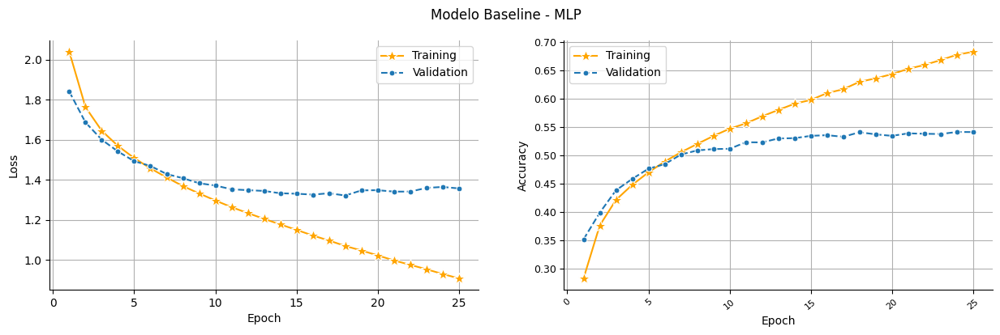

In [ ]:
title = 'Modelo Baseline - MLP'
plot_loss(experiment['register_performance'], title=title)

In [ ]:
# Revisar los valores de los parámetros
experiment['best_model'].state_dict()['hidden_layer1.weight']

tensor([[ 1.7836e-02, -1.7021e-02,  3.9897e-03,  ...,  1.7442e-02,
          1.1406e-02, -9.1898e-03],
        [-2.2910e-02,  1.9665e-03,  6.5471e-03,  ..., -5.0298e-05,
         -1.7464e-02,  1.1647e-02],
        [-6.7365e-03,  7.1348e-03,  4.5976e-03,  ...,  1.6626e-02,
         -3.0598e-03,  2.1927e-02],
        ...,
        [ 1.3267e-02, -5.9399e-03, -1.5039e-03,  ...,  5.0147e-03,
          6.7179e-03, -5.3184e-03],
        [-8.3873e-03,  2.0759e-03,  1.4001e-02,  ..., -1.3598e-02,
          1.0631e-02, -2.2579e-03],
        [-5.0006e-03,  1.1611e-02,  2.4047e-02,  ..., -8.9902e-03,
          6.4398e-03, -1.5459e-02]])

In [ ]:
# Modelo con bajo número de capas y neuronas
n_hidden = 128
# Instan
model = SimpleMLP(n_inputs, n_outputs, n_hidden, activation_function)
optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum)
print(f'Model: {model}')
experiment = run_experiment(model, EPOCHS, trainloader, testloader, loss_function, optimizer)
experiments.append(experiment)

Model: SimpleMLP(
  (hidden_layer1): Linear(in_features=3072, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.336, Validation accuracy=0.396


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.416, Validation accuracy=0.441


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.445, Validation accuracy=0.459


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.466, Validation accuracy=0.471


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.479, Validation accuracy=0.478


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.492, Validation accuracy=0.483


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.503, Validation accuracy=0.493


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.515, Validation accuracy=0.497


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.526, Validation accuracy=0.500


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.536, Validation accuracy=0.504


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.543, Validation accuracy=0.508


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.551, Validation accuracy=0.510


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.558, Validation accuracy=0.512


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.565, Validation accuracy=0.519


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.570, Validation accuracy=0.522


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.578, Validation accuracy=0.521


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.584, Validation accuracy=0.521


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.591, Validation accuracy=0.522


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.596, Validation accuracy=0.523


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.600, Validation accuracy=0.525


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.605, Validation accuracy=0.524


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.610, Validation accuracy=0.526


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.616, Validation accuracy=0.521


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.621, Validation accuracy=0.525


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.625, Validation accuracy=0.529
Training finished!
Completed training in 25 batch:  
	-Training Loss:  1.099 - Validation Loss:  1.355 
	- Training Accuracy:  0.62458 - Validation Accuracy:  0.5286 - Validation F1:  0.5259


In [ ]:
# Modelo con varias capas y más neuronas (que el modelo anterior)
experimentn_hidden = 128
model = BigMLP(n_inputs, n_outputs, n_hidden, activation_function)
optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum)
print(f'Model: {model}')
experiment = run_experiment(model, EPOCHS, trainloader, testloader, loss_function, optimizer)
experiments.append(experiment)

Model: BigMLP(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=512, bias=True)
  (hidden_layer3): Linear(in_features=512, out_features=1024, bias=True)
  (hidden_layer4): Linear(in_features=1024, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.170, Validation accuracy=0.248


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.243, Validation accuracy=0.272


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.299, Validation accuracy=0.339


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.356, Validation accuracy=0.381


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.394, Validation accuracy=0.420


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.427, Validation accuracy=0.444


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.452, Validation accuracy=0.465


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.476, Validation accuracy=0.477


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.496, Validation accuracy=0.491


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.516, Validation accuracy=0.498


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.530, Validation accuracy=0.515


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.547, Validation accuracy=0.522


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.562, Validation accuracy=0.530


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.575, Validation accuracy=0.532


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.585, Validation accuracy=0.525


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.599, Validation accuracy=0.527


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.609, Validation accuracy=0.533


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.623, Validation accuracy=0.533


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.631, Validation accuracy=0.536


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.641, Validation accuracy=0.531


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.652, Validation accuracy=0.537


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.663, Validation accuracy=0.532


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.671, Validation accuracy=0.528


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.684, Validation accuracy=0.524


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.691, Validation accuracy=0.537
Training finished!
Completed training in 25 batch:  
	-Training Loss:  0.8592 - Validation Loss:  1.4123 
	- Training Accuracy:  0.69122 - Validation Accuracy:  0.5374 - Validation F1:  0.5319


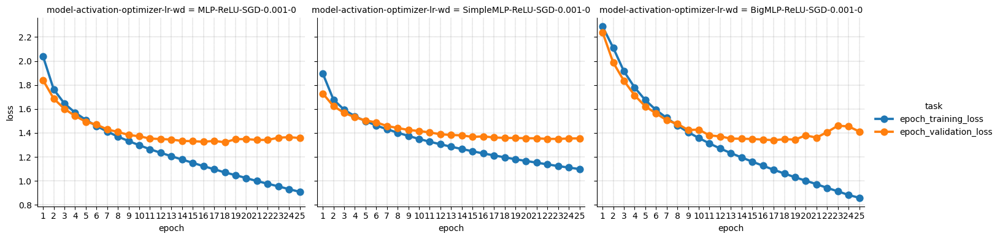

In [ ]:
# Obtener y graficar las pérdidas
experiments_set = experiments
df_loss, df_metrics = get_loss_and_metrics_data(experiments_set)
g = sns.catplot(data=df_loss, x='epoch', y='loss',  hue='task', col='model-activation-optimizer-lr-wd',
            col_wrap=3, kind='point', height=4, aspect=1.2)
for ax in g.axes.flat:
    ax.grid(True, color='grey', linestyle='--', linewidth=0.3)
plt.show()

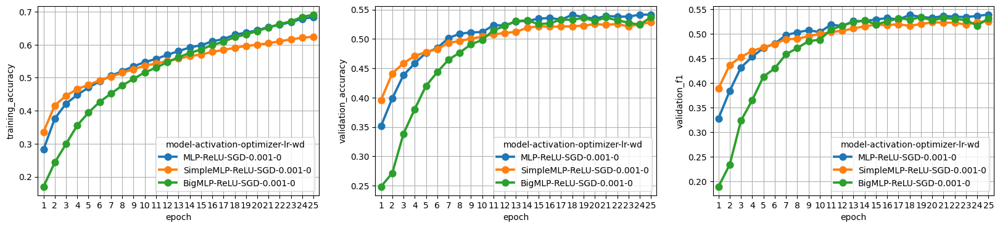

In [ ]:
# Graficar las métricas
metrics_plots(df_metrics)

### ¿Cómo consultar el número de Parámetros de una Red Neuronal
Podemos saber la cantidad de parámetros entrenables que tiene cada modelo:

In [ ]:
# Modelo SimpleMLP
experiments[0]['best_model']

MLP(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
)

In [ ]:
# Número de parámetros de la red SimpleMLP
# (3072 + 1) * 128 + (128 + 1) * 10
print(f'N° parámetros: {(n_inputs + 1) * n_hidden + (n_hidden + 1) * n_outputs:,}')

N° parámetros: 394,634


In [ ]:
print('Trained parameters in:')
print("- MLP", f'{sum(p.numel() for p in experiments[0]["best_model"].parameters() if p.requires_grad):,}')
print("- SimpleMLP", f'{sum(p.numel() for p in experiments[1]["best_model"].parameters() if p.requires_grad):,}')
print("- BigMLP", f'{sum(p.numel() for p in experiments[2]["best_model"].parameters() if p.requires_grad):,}')

Trained parameters in:
- MLP 820,874
- SimpleMLP 394,634
- BigMLP 1,576,074


## Funciones de Activación

- Red neuronal con activación lineal == algoritmo lineal.
- Representación de no linearidad en la red neuronal → funciones de activación no lineales.
- Funciones de activación más comunes:
    - *sigmoide* (logística), 👀
    - *tanh* (tangente hiperbólica) y
    - *ReLU* (por sus propiedades es la más utilizada)
    - *Leaky ReLU* (variante de la ReLU)
- La función de activación Softmax suele utilizarse al final de una red que clasifica múltiples clases, tiene como objetivo transformar un vector de scores en un vector probabilístico. Se solía utilizar en las primeras versiones de muchos frameworks de deep learning, y ahora se incluye directamente en la función de costo.
- En PyTorch la mayoría de estas funciones se definen en el módulo [`torch.nn.functional`](https://pytorch.org/docs/stable/nn.functional.html).


In [ ]:
activfunc_experiments = []

# Modelo con función de activación Sigmoide
# Instantiate the model
n_hidden = 128
model = MLP(n_inputs, n_outputs, n_hidden, activation_functions['Sigmoid'])
# Instantiate optimizer
optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum)
print(f'Model: {model}')
experiment = run_experiment(model, EPOCHS, trainloader, testloader, loss_function, optimizer)
experiments.append(experiment)
activfunc_experiments.append(experiment)

Model: MLP(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): Sigmoid()
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.134, Validation accuracy=0.167


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.180, Validation accuracy=0.180


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.201, Validation accuracy=0.193


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.227, Validation accuracy=0.239


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.252, Validation accuracy=0.263


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.263, Validation accuracy=0.271


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.274, Validation accuracy=0.282


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.282, Validation accuracy=0.291


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.293, Validation accuracy=0.296


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.301, Validation accuracy=0.308


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.310, Validation accuracy=0.312


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.316, Validation accuracy=0.325


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.324, Validation accuracy=0.327


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.331, Validation accuracy=0.335


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.336, Validation accuracy=0.339


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.340, Validation accuracy=0.343


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.346, Validation accuracy=0.350


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.349, Validation accuracy=0.354


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.355, Validation accuracy=0.354


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.358, Validation accuracy=0.363


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.361, Validation accuracy=0.362


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.364, Validation accuracy=0.370


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.366, Validation accuracy=0.370


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.369, Validation accuracy=0.371


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.373, Validation accuracy=0.375
Training finished!
Completed training in 25 batch:  
	-Training Loss:  1.7634 - Validation Loss:  1.7593 
	- Training Accuracy:  0.37306 - Validation Accuracy:  0.3746 - Validation F1:  0.362


In [ ]:
# Modelo con función de activación Tanh
# Instantiate the model
n_hidden = 128
model = MLP(n_inputs, n_outputs, n_hidden, activation_functions['Tanh'])
# Instantiate optimizer
optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum)
print(f'Model: {model}')
experiment = run_experiment(model, EPOCHS, trainloader, testloader, loss_function, optimizer)
experiments.append(experiment)
activfunc_experiments.append(experiment)

Model: MLP(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): Tanh()
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.316, Validation accuracy=0.375


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.381, Validation accuracy=0.394


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.401, Validation accuracy=0.406


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.415, Validation accuracy=0.416


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.424, Validation accuracy=0.426


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.435, Validation accuracy=0.433


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.444, Validation accuracy=0.436


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.452, Validation accuracy=0.443


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.463, Validation accuracy=0.449


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.471, Validation accuracy=0.460


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.478, Validation accuracy=0.464


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.488, Validation accuracy=0.468


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.497, Validation accuracy=0.473


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.505, Validation accuracy=0.477


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.514, Validation accuracy=0.481


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.521, Validation accuracy=0.479


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.527, Validation accuracy=0.489


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.536, Validation accuracy=0.496


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.547, Validation accuracy=0.493


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.553, Validation accuracy=0.494


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.561, Validation accuracy=0.498


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.569, Validation accuracy=0.500


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.578, Validation accuracy=0.496


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.583, Validation accuracy=0.501


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.593, Validation accuracy=0.498
Training finished!
Completed training in 25 batch:  
	-Training Loss:  1.1851 - Validation Loss:  1.461 
	- Training Accuracy:  0.59252 - Validation Accuracy:  0.4984 - Validation F1:  0.4928


In [ ]:
# Modelo con función de activación Leaky ReLU
# Instantiate the model
n_hidden = 128
model = MLP(n_inputs, n_outputs, n_hidden, activation_functions['LeakyReLU'])
# Instantiate optimizer
optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum)
print(f'Model: {model}')
experiment = run_experiment(model, EPOCHS, trainloader, testloader, loss_function, optimizer)
experiments.append(experiment)
activfunc_experiments.append(experiment)

Model: MLP(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): LeakyReLU(negative_slope=0.01)
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.271, Validation accuracy=0.341


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.371, Validation accuracy=0.399


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.416, Validation accuracy=0.434


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.444, Validation accuracy=0.456


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.467, Validation accuracy=0.469


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.486, Validation accuracy=0.484


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.500, Validation accuracy=0.502


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.516, Validation accuracy=0.508


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.530, Validation accuracy=0.513


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.543, Validation accuracy=0.515


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.555, Validation accuracy=0.520


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.567, Validation accuracy=0.527


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.577, Validation accuracy=0.530


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.587, Validation accuracy=0.531


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.598, Validation accuracy=0.530


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.606, Validation accuracy=0.538


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.618, Validation accuracy=0.539


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.626, Validation accuracy=0.543


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.637, Validation accuracy=0.537


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.646, Validation accuracy=0.537


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.652, Validation accuracy=0.541


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.662, Validation accuracy=0.531


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.668, Validation accuracy=0.532


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.675, Validation accuracy=0.531


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.688, Validation accuracy=0.533
Training finished!
Completed training in 25 batch:  
	-Training Loss:  0.9058 - Validation Loss:  1.3781 
	- Training Accuracy:  0.68812 - Validation Accuracy:  0.5333 - Validation F1:  0.5322


In [ ]:
activfunc_experiments[0]['best_model'], activfunc_experiments[0]['optimizer']

(MLP(
   (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
   (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
   (output_layer): Linear(in_features=128, out_features=10, bias=True)
   (activation_function): Sigmoid()
 ),
 SGD (
 Parameter Group 0
     dampening: 0
     differentiable: False
     foreach: None
     fused: None
     lr: 0.001
     maximize: False
     momentum: 0.9
     nesterov: False
     weight_decay: 0
 ))

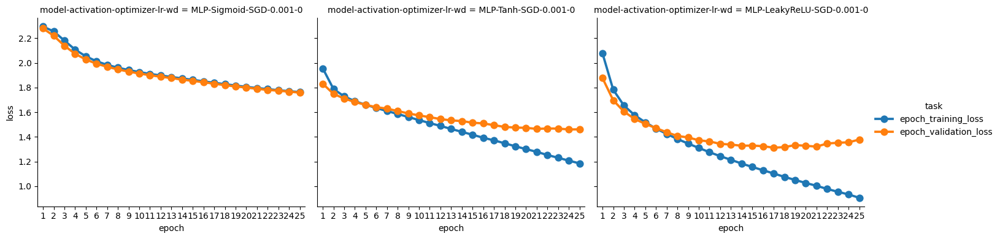

In [ ]:
# Obtener y graficar las pérdidas
experiments_set = activfunc_experiments
df_loss, df_metrics = get_loss_and_metrics_data(experiments_set)
sns.catplot(data=df_loss, x='epoch', y='loss',  hue='task', col='model-activation-optimizer-lr-wd',
            col_wrap=3, kind='point', height=4, aspect=1.2)
plt.show()

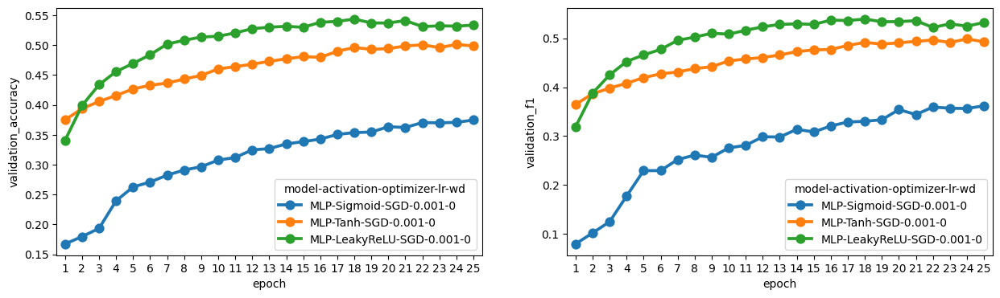

In [ ]:
# Graficar las métricas
metrics_plots(df_metrics)

La elección de la función de activación tiene un papel importante en el rendimiento del modelo. Sin embargo, la función de activación óptima resultante va a variar, dependiendo del conjunto de datos trabajados y según el tipo de tarea que desempeñe el modelo.

## Learning Rate y Optimizer

- El *learning rate* determina con qué "velocidad" aprende una red.
    - Si el lr es muy bajo, la red aprende muy lento, ya que los pesos se optimizan con deltas muy pequeños.
    - Si el lr es muy alto, la red puede provocar que la red diverja.
    - Los mejores resultados se consiguen cambiando el learning rate durante el entrenamiento.
- El algoritmo de optimización determina cómo se actualizan los pesos de la red y el learning rate.
    - Si se utiliza el optimizador *SGD* (stochastic gradient descent) es recomendable asignar valores al `momentum`, de lo contrario, utilizará el mismo lr durante todo el entrenamiento y suele ser muy lento.
    - Los optimizadores más genéricos y que mejor funcionan son *Adam* y *RMSProp*.

### Optimizadores

La elección de un optimizador u otro puede tener un importante impacto en el resultado, principalmente en los tiempos de entrenamiento.

Algunos optimizadores como el SGD, RMSProp, y Adam emplean un parámetro `momentum` que determina la velocidad de aprendizaje. Este *momentum* está determinado por la ecuación:

        Promedio Exponencial (EWMA) de los gradientes de una iteración:

$$v_t = β*v_{t-1} + (1 − β)*g_t$$
$$β=[0, 1]$$

        donde:
$$g_t = ∇f(w_t): gradiente\_ para\_ w_t$$   


        1/(1-β) : número de iteraciones que considera para el cálculo del promedio
        para β =0.90 --> 1/1-0.9 = 10
        para β=0.95  --> 1/1-0.95 = 20


$$v_{t+1} = β*v_t + α*∇f(w_t)$$

$$w_{t+1} = w_t − v_{t+1}$$




https://paperswithcode.com/method/sgd-with-momentum

**Lista de Algunos Optimizadores**


* [Adam](https://pytorch.org/docs/stable/generated/torch.optim.Adam.html)
* [Adagrad](https://pytorch.org/docs/stable/generated/torch.optim.Adagrad.html)
* [Adam](https://pytorch.org/docs/stable/generated/torch.optim.Adam.html)
* [RMSprop](https://pytorch.org/docs/stable/generated/torch.optim.RMSprop.html)
* [SGD](https://pytorch.org/docs/stable/generated/torch.optim.SGD.html)


In [ ]:
optim_lr_experiments = []
momentum = 0.9
# This is going to take some time!
for lr in [0.0001, 0.005, 0.01]:
    model = SimpleMLP(n_inputs, n_outputs, n_hidden, activation_functions['ReLU'])
    optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum)
    print(f"\nExploring lr = {lr} \nModel: {model}")
    experiment = run_experiment(model, EPOCHS, trainloader, testloader, loss_function, optimizer)
    optim_lr_experiments.append(experiment)


Exploring lr = 0.0001 
Model: SimpleMLP(
  (hidden_layer1): Linear(in_features=3072, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
)
Begin training...


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.197, Validation accuracy=0.254


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.262, Validation accuracy=0.287


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.287, Validation accuracy=0.309


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.308, Validation accuracy=0.323


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.324, Validation accuracy=0.333


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.336, Validation accuracy=0.342


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.345, Validation accuracy=0.351


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.352, Validation accuracy=0.359


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.359, Validation accuracy=0.365


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.365, Validation accuracy=0.372


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.370, Validation accuracy=0.378


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.374, Validation accuracy=0.381


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.377, Validation accuracy=0.385


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.381, Validation accuracy=0.387


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.384, Validation accuracy=0.391


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.389, Validation accuracy=0.394


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.391, Validation accuracy=0.397


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.394, Validation accuracy=0.398


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.397, Validation accuracy=0.401


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.400, Validation accuracy=0.404


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.403, Validation accuracy=0.406


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.406, Validation accuracy=0.408


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.408, Validation accuracy=0.410


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.411, Validation accuracy=0.412


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.414, Validation accuracy=0.413
Training finished!
Completed training in 25 batch:  
	-Training Loss:  1.691 - Validation Loss:  1.6876 
	- Training Accuracy:  0.41432 - Validation Accuracy:  0.4131 - Validation F1:  0.4075

Exploring lr = 0.005 
Model: SimpleMLP(
  (hidden_layer1): Linear(in_features=3072, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
)
Begin training...


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.373, Validation accuracy=0.432


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.452, Validation accuracy=0.464


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.483, Validation accuracy=0.484


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.508, Validation accuracy=0.499


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.527, Validation accuracy=0.508


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.541, Validation accuracy=0.509


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.556, Validation accuracy=0.505


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.566, Validation accuracy=0.512


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.580, Validation accuracy=0.511


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.589, Validation accuracy=0.521


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.597, Validation accuracy=0.521


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.607, Validation accuracy=0.520


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.613, Validation accuracy=0.511


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.622, Validation accuracy=0.515


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.630, Validation accuracy=0.520


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.636, Validation accuracy=0.523


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.642, Validation accuracy=0.516


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.651, Validation accuracy=0.522


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.656, Validation accuracy=0.521


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.663, Validation accuracy=0.519


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.668, Validation accuracy=0.518


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.677, Validation accuracy=0.518


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.680, Validation accuracy=0.515


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.683, Validation accuracy=0.516


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.691, Validation accuracy=0.516
Training finished!
Completed training in 25 batch:  
	-Training Loss:  0.8979 - Validation Loss:  1.4585 
	- Training Accuracy:  0.69074 - Validation Accuracy:  0.5163 - Validation F1:  0.5165

Exploring lr = 0.01 
Model: SimpleMLP(
  (hidden_layer1): Linear(in_features=3072, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
)
Begin training...


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.396, Validation accuracy=0.460


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.475, Validation accuracy=0.483


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.509, Validation accuracy=0.491


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.530, Validation accuracy=0.500


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.547, Validation accuracy=0.507


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.565, Validation accuracy=0.507


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.577, Validation accuracy=0.505


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.588, Validation accuracy=0.519


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.600, Validation accuracy=0.521


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.609, Validation accuracy=0.516


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.619, Validation accuracy=0.512


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.627, Validation accuracy=0.522


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.634, Validation accuracy=0.512


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.646, Validation accuracy=0.514


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.651, Validation accuracy=0.522


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.662, Validation accuracy=0.509


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.664, Validation accuracy=0.499


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.672, Validation accuracy=0.522


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.682, Validation accuracy=0.516


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.687, Validation accuracy=0.507


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.692, Validation accuracy=0.513


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.699, Validation accuracy=0.511


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.706, Validation accuracy=0.521


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.708, Validation accuracy=0.508


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.719, Validation accuracy=0.518
Training finished!
Completed training in 25 batch:  
	-Training Loss:  0.8142 - Validation Loss:  1.6108 
	- Training Accuracy:  0.71892 - Validation Accuracy:  0.518 - Validation F1:  0.5163


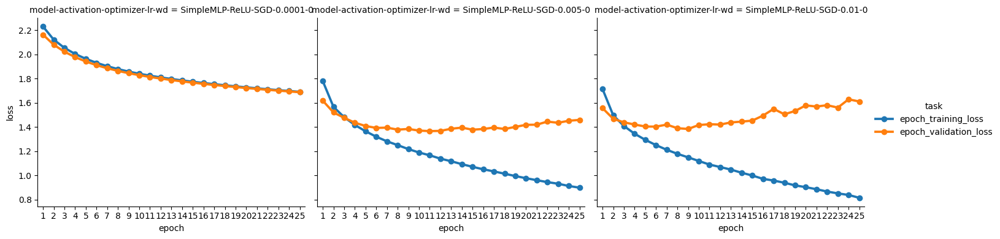

In [ ]:
# Obtener y graficar las pérdidas
experiments_set = optim_lr_experiments
df_loss, df_metrics = get_loss_and_metrics_data(experiments_set)

sns.catplot(data=df_loss, x='epoch', y='loss',  hue='task', col='model-activation-optimizer-lr-wd',
            col_wrap=3, kind='point', height=4, aspect=1.2, markersize=5)
plt.show()

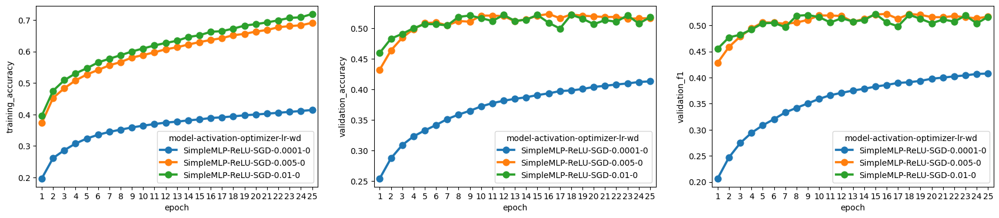

In [ ]:
# Graficar las métricas
metrics_plots(df_metrics)

In [ ]:
# OPTIMIZADORES
optim_experiments = []
lr = 0.001
# This is going to take some time!
for optimizer_class in [optim.Adagrad, optim.RMSprop, optim.Adam]:  #  Adaptative Gradient Algorithm - Root Mean Square Propagation - Adaptive Moment Estimation
    model = MLP(n_inputs, n_outputs, n_hidden, activation_functions['ReLU'])
    optimizer = optimizer_class(model.parameters(), lr=lr)
    print(f"\nExploring optimizer = {optimizer} \nModel: {model}")
    experiment = run_experiment(model, EPOCHS, trainloader, testloader, loss_function, optimizer)
    optim_experiments.append(experiment)


Exploring optimizer = Adagrad (
Parameter Group 0
    differentiable: False
    eps: 1e-10
    foreach: None
    fused: None
    initial_accumulator_value: 0
    lr: 0.001
    lr_decay: 0
    maximize: False
    weight_decay: 0
) 
Model: MLP(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.395, Validation accuracy=0.438


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.446, Validation accuracy=0.455


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.464, Validation accuracy=0.467


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.475, Validation accuracy=0.473


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.484, Validation accuracy=0.480


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.491, Validation accuracy=0.481


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.497, Validation accuracy=0.486


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.503, Validation accuracy=0.488


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.508, Validation accuracy=0.493


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.512, Validation accuracy=0.493


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.517, Validation accuracy=0.496


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.521, Validation accuracy=0.498


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.524, Validation accuracy=0.502


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.527, Validation accuracy=0.502


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.531, Validation accuracy=0.502


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.534, Validation accuracy=0.505


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.536, Validation accuracy=0.504


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.540, Validation accuracy=0.508


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.542, Validation accuracy=0.509


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.545, Validation accuracy=0.510


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.547, Validation accuracy=0.511


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.550, Validation accuracy=0.512


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.551, Validation accuracy=0.514


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.553, Validation accuracy=0.512


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.556, Validation accuracy=0.514
Training finished!
Completed training in 25 batch:  
	-Training Loss:  1.2954 - Validation Loss:  1.3872 
	- Training Accuracy:  0.55588 - Validation Accuracy:  0.5142 - Validation F1:  0.5109

Exploring optimizer = RMSprop (
Parameter Group 0
    alpha: 0.99
    capturable: False
    centered: False
    differentiable: False
    eps: 1e-08
    foreach: None
    lr: 0.001
    maximize: False
    momentum: 0
    weight_decay: 0
) 
Model: MLP(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.420, Validation accuracy=0.423


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.495, Validation accuracy=0.497


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.533, Validation accuracy=0.496


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.560, Validation accuracy=0.480


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.587, Validation accuracy=0.501


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.610, Validation accuracy=0.509


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.632, Validation accuracy=0.500


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.651, Validation accuracy=0.491


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.667, Validation accuracy=0.523


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.684, Validation accuracy=0.511


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.701, Validation accuracy=0.504


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.719, Validation accuracy=0.517


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.735, Validation accuracy=0.510


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.744, Validation accuracy=0.501


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.759, Validation accuracy=0.504


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.772, Validation accuracy=0.503


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.785, Validation accuracy=0.513


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.795, Validation accuracy=0.506


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.806, Validation accuracy=0.504


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.815, Validation accuracy=0.509


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.823, Validation accuracy=0.502


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.830, Validation accuracy=0.500


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.838, Validation accuracy=0.496


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.848, Validation accuracy=0.493


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.854, Validation accuracy=0.509
Training finished!
Completed training in 25 batch:  
	-Training Loss:  0.4132 - Validation Loss:  2.5608 
	- Training Accuracy:  0.85446 - Validation Accuracy:  0.5092 - Validation F1:  0.5092

Exploring optimizer = Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.001
    maximize: False
    weight_decay: 0
) 
Model: MLP(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.419, Validation accuracy=0.468


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.492, Validation accuracy=0.496


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.535, Validation accuracy=0.516


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.565, Validation accuracy=0.518


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.589, Validation accuracy=0.521


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.610, Validation accuracy=0.527


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.630, Validation accuracy=0.531


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.654, Validation accuracy=0.543


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.669, Validation accuracy=0.535


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.685, Validation accuracy=0.529


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.703, Validation accuracy=0.532


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.718, Validation accuracy=0.534


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.735, Validation accuracy=0.527


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.751, Validation accuracy=0.525


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.763, Validation accuracy=0.532


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.777, Validation accuracy=0.531


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.788, Validation accuracy=0.520


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.800, Validation accuracy=0.522


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.805, Validation accuracy=0.532


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.821, Validation accuracy=0.525


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.825, Validation accuracy=0.515


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.832, Validation accuracy=0.517


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.845, Validation accuracy=0.519


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.848, Validation accuracy=0.521


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.855, Validation accuracy=0.526
Training finished!
Completed training in 25 batch:  
	-Training Loss:  0.4073 - Validation Loss:  2.4476 
	- Training Accuracy:  0.85478 - Validation Accuracy:  0.5258 - Validation F1:  0.5244


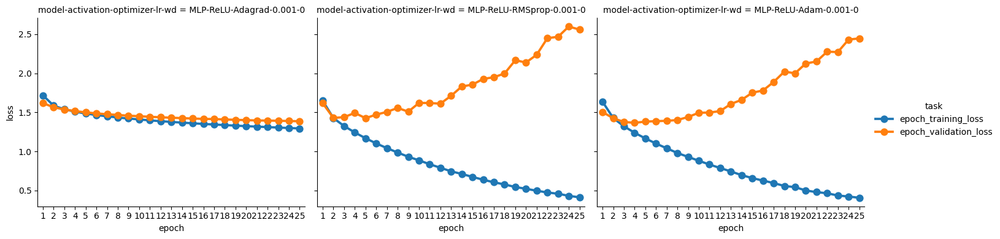

In [ ]:
# Obtener y graficar las pérdidas
experiments_set = optim_experiments
df_loss, df_metrics = get_loss_and_metrics_data(experiments_set)

sns.catplot(data=df_loss, x='epoch', y='loss',  hue='task', col='model-activation-optimizer-lr-wd',
            col_wrap=3, kind='point', height=4, aspect=1.2)
plt.show()

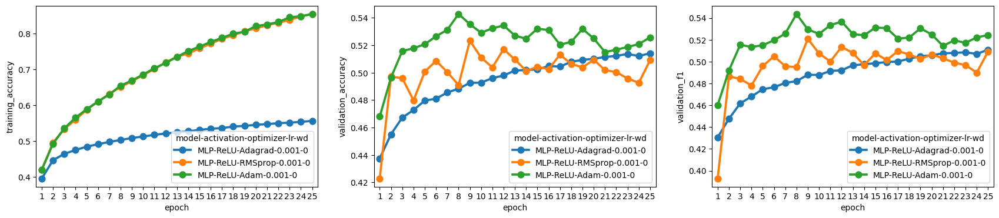

In [ ]:
# Graficar las métricas
metrics_plots(df_metrics)

## Regularización de los pesos de la red

$$L_{new}\left(w\right) = L_{original}\left(w\right) + \lambda{w^{T}w}$$

- La red puede regularizarse penalizando la magnitud de los parámetros.
- Los pesos se regularizan mediante alguna norma:
    - L1 es la suma del valor absoluto:
  $\lambda\sum_{i=1}^{k}|w_i|$
    - L2 es la suma del valor cuadrado, es la más común: ${\displaystyle \lambda \sum_{i=1}^{k} w_i^2}$
    - Elastic net es una combinación de ambas: ${\displaystyle \lambda_1 \sum_{i=1}^{k} |w_i| + \lambda_2 \sum_{i=1}^{k} w_i^2}$
- Para un análisis detallado de la diferencia entre L1 y L2 revisar [\[2\]](http://www.chioka.in/differences-between-l1-and-l2-as-loss-function-and-regularization/)

Varios (sino todos) los algoritmos de optimización implementados en `torch.optim` vienen con una implementación de la norma L2 para regularización (que suele ser la norma por defecto), simplemente se debe seleccionar el valor de $\lambda$ que viene representado por el parámetro `weight_decay`.

```python
model = MLP()
loss_function = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(),
                       lr=0.001,
                       weight_decay=0.001)
```

### Regularizar desde  el loop de entrenamiento

Si queremos mayor control (e.g. implementar una versión de L1 o ElasticNet), debemos hacerlo como parte del *training loop*:

```python
l1_lambda = 0.001
model = model.to(device)
model.train()
for inputs, labels in tqdm(trainloader):
    inputs = inputs.to(device)
    labels = labels.to(device)
    optimizer.zero_grad()
    outputs = model(inputs.view(inputs.shape[0], -1))
    loss = loss_function(outputs, labels)

    l1_reg = torch.tensor(0.).to(device)
    for param in model.parameters():
        l1_reg += torch.norm(param, p=1)
    loss += l1_reg * l1_lambda

    loss.backward()
    optimizer.step()
```

### Aplicar regularización sólo a los parámetros

En el caso anterior se regularizan todos los pesos (los pesos de las variables y de los bias).

Si sólo queremos regularizar los pesos de las variables, se puede utilizar [`nn.Module.named_parameters`](https://pytorch.org/docs/stable/generated/torch.nn.Module.html#torch.nn.Module.named_parameters) y filtrar aquellos parámetros que tengan `bias` en el nombre. Así:

```python
l1_reg = torch.tensor(0.)
for param_name, param_weight in model.named_parameters():
    if 'bias' not in param_name:
        l1_reg += torch.norm(param, p=1)
```

[Optimizadores en Pytorch](https://pytorch.org/docs/stable/optim.html#how-to-use-an-optimizer)

Veamos un poco en la práctica:

In [ ]:
# EPOCHS = 60
weight_decay_experiments = []
for weight_decay in [0.001, 0.01, 0.05, 0.1]:
    model = MLP(n_inputs, n_outputs, n_hidden, activation_functions['ReLU'])  # It's important to re-define the model to avoid keep training an earlier version
    print(f"\nExploring weight decay = {weight_decay} \nModel: {model}")
    optimizer = optim.SGD(model.parameters(), lr=0.001, weight_decay=weight_decay)
    # optimizer = optim.Adadelta(model.parameters(), lr=0.01, weight_decay=weight_decay)  # Adadelta
    # optimizer = optim.Adagrad(model.parameters(), lr=0.01, weight_decay=weight_decay)   # Adaptative Gradient Algorithm
    # optimizer = optim.Adam(model.parameters(), lr=0.01, weight_decay=weight_decay)      # Adaptive Moment Estimation
    # optimizer = optim.RMSprop(model.parameters(), lr=0.01, weight_decay=weight_decay)   # Root Mean Square Propagation
    weight_decay_experiments.append(run_experiment(model, EPOCHS, trainloader, testloader, loss_function, optimizer))


Exploring weight decay = 0.001 
Model: MLP(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.164, Validation accuracy=0.213


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.221, Validation accuracy=0.231


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.236, Validation accuracy=0.249


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.255, Validation accuracy=0.273


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.279, Validation accuracy=0.297


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.301, Validation accuracy=0.316


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.317, Validation accuracy=0.330


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.331, Validation accuracy=0.338


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.343, Validation accuracy=0.347


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.351, Validation accuracy=0.354


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.359, Validation accuracy=0.360


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.366, Validation accuracy=0.369


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.372, Validation accuracy=0.376


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.377, Validation accuracy=0.381


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.381, Validation accuracy=0.387


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.387, Validation accuracy=0.393


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.393, Validation accuracy=0.396


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.397, Validation accuracy=0.400


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.401, Validation accuracy=0.405


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.405, Validation accuracy=0.409


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.408, Validation accuracy=0.413


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.413, Validation accuracy=0.418


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.415, Validation accuracy=0.420


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.420, Validation accuracy=0.422


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.423, Validation accuracy=0.424
Training finished!
Completed training in 25 batch:  
	-Training Loss:  1.6406 - Validation Loss:  1.6364 
	- Training Accuracy:  0.42292 - Validation Accuracy:  0.4245 - Validation F1:  0.4192

Exploring weight decay = 0.05 
Model: MLP(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.162, Validation accuracy=0.225


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.238, Validation accuracy=0.254


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.253, Validation accuracy=0.261


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.261, Validation accuracy=0.268


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.267, Validation accuracy=0.277


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.275, Validation accuracy=0.284


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.284, Validation accuracy=0.293


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.292, Validation accuracy=0.299


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.301, Validation accuracy=0.306


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.307, Validation accuracy=0.313


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.313, Validation accuracy=0.320


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.319, Validation accuracy=0.323


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.324, Validation accuracy=0.328


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.328, Validation accuracy=0.332


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.331, Validation accuracy=0.335


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.335, Validation accuracy=0.338


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.338, Validation accuracy=0.341


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.341, Validation accuracy=0.344


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.343, Validation accuracy=0.349


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.345, Validation accuracy=0.349


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.348, Validation accuracy=0.350


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.349, Validation accuracy=0.353


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.351, Validation accuracy=0.354


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.352, Validation accuracy=0.355


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.353, Validation accuracy=0.356
Training finished!
Completed training in 25 batch:  
	-Training Loss:  1.8333 - Validation Loss:  1.8275 
	- Training Accuracy:  0.35272 - Validation Accuracy:  0.3557 - Validation F1:  0.3332

Exploring weight decay = 0.01 
Model: MLP(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.149, Validation accuracy=0.209


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.232, Validation accuracy=0.255


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.259, Validation accuracy=0.272


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.270, Validation accuracy=0.282


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.280, Validation accuracy=0.292


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.293, Validation accuracy=0.305


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.304, Validation accuracy=0.314


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.315, Validation accuracy=0.323


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.325, Validation accuracy=0.329


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.332, Validation accuracy=0.335


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.340, Validation accuracy=0.346


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.348, Validation accuracy=0.354


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.356, Validation accuracy=0.360


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.362, Validation accuracy=0.367


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.368, Validation accuracy=0.377


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.373, Validation accuracy=0.381


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.379, Validation accuracy=0.387


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.383, Validation accuracy=0.390


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.387, Validation accuracy=0.394


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.391, Validation accuracy=0.397


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.397, Validation accuracy=0.403


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.400, Validation accuracy=0.404


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.404, Validation accuracy=0.407


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.406, Validation accuracy=0.409


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.409, Validation accuracy=0.414
Training finished!
Completed training in 25 batch:  
	-Training Loss:  1.6827 - Validation Loss:  1.6758 
	- Training Accuracy:  0.40924 - Validation Accuracy:  0.4142 - Validation F1:  0.4093

Exploring weight decay = 0.1 
Model: MLP(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.150, Validation accuracy=0.178


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.201, Validation accuracy=0.219


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.238, Validation accuracy=0.256


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.260, Validation accuracy=0.265


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.261, Validation accuracy=0.257


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.253, Validation accuracy=0.253


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.252, Validation accuracy=0.254


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.252, Validation accuracy=0.257


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.254, Validation accuracy=0.261


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.254, Validation accuracy=0.264


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.255, Validation accuracy=0.266


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.257, Validation accuracy=0.267


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.256, Validation accuracy=0.266


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.257, Validation accuracy=0.267


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.259, Validation accuracy=0.266


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.258, Validation accuracy=0.268


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.260, Validation accuracy=0.267


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.261, Validation accuracy=0.268


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.260, Validation accuracy=0.269


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.261, Validation accuracy=0.268


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.262, Validation accuracy=0.267


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.261, Validation accuracy=0.266


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.261, Validation accuracy=0.268


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.262, Validation accuracy=0.268


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.262, Validation accuracy=0.267
Training finished!
Completed training in 25 batch:  
	-Training Loss:  1.9984 - Validation Loss:  1.9932 
	- Training Accuracy:  0.26214 - Validation Accuracy:  0.2666 - Validation F1:  0.2094


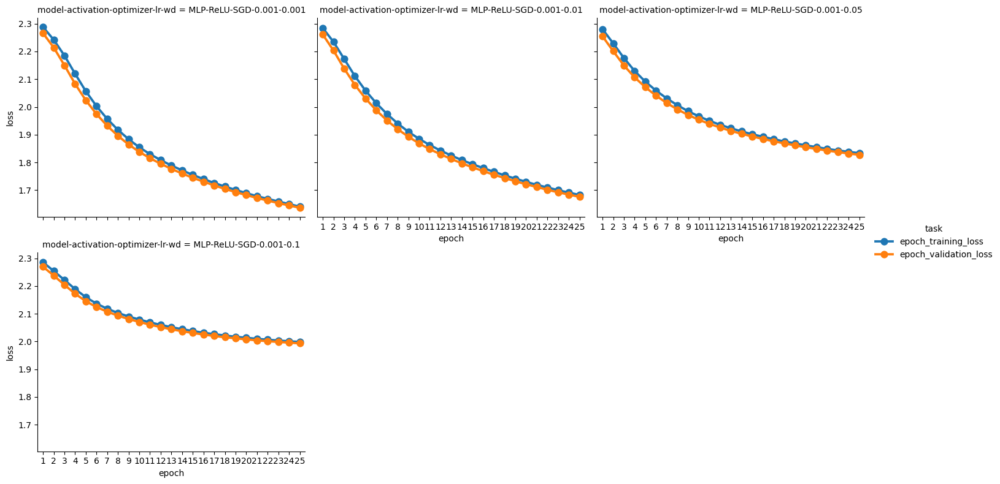

In [ ]:
# Obtener y graficar las pérdidas
experiments_set = weight_decay_experiments
df_loss, df_metrics = get_loss_and_metrics_data(experiments_set)

sns.catplot(data=df_loss, x='epoch', y='loss',  hue='task', col='model-activation-optimizer-lr-wd',
            col_wrap=3, kind='point', height=4, aspect=1.2)
plt.show()

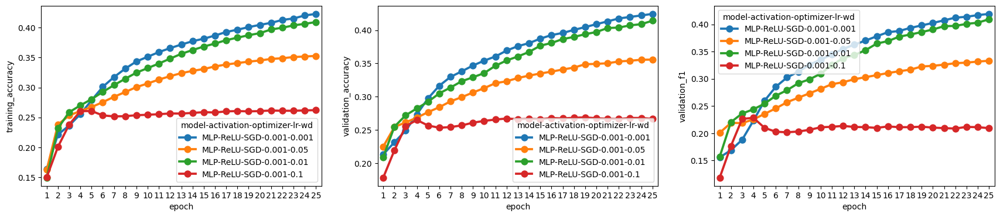

In [ ]:
# Graficar las métricas
metrics_plots(df_metrics)

## Dropout

- Es otra forma muy usada a la hora de regularizar.
- Es extremadamente efectivo y simple.
- Es complementario a L1/L2/ElasticNet.
- Durante el entrenamiento se implementa apagando un neurón con alguna probabilidad **_p_** (un hiperparámetro).

<img style="margin:auto;width:75%;" src="https://github.com/DiploDatos/AprendizajeProfundo/blob/master/images/dropout.jpeg?raw=1" alt="Dropout" title="Dropout"/>
<div style="text-align:right;font-size:0.75em;"></div>

Fuente: [Dropout: A Simple Way to Prevent Neural Networks from
Overfitting. Srivastava et al.](https://www.cs.toronto.edu/~rsalakhu/papers/srivastava14a.pdf)

---
En Pytorch, el dropout se implementa agregando capas al modelo. Se utiliza la clase [`torch.nn.Dropout`](https://pytorch.org/docs/stable/generated/torch.nn.Dropout.html) y se agrega después de la capa que se quiere regularizar. Ejemplo:

```python
model = nn.Sequential(
    nn.Linear(32 * 32 * 3, 512),
    nn.ReLU(),
    nn.Dropout(p=0.3),
    nn.Linear(512, 10)
)
```

 ❗👀 [¿El dropout se adiciona luego de aplicar la función de activación?](https://sebastianraschka.com/faq/docs/dropout-activation.html#is-dropout-applied-before-or-after-the-non-linear-activation-fun)

 Other considerations:
- **Rectified linear units (ReLUs)**: For computational efficiency, dropout can be applied before the non-linear activation function for ReLUs.
- **Global average pooling**: Some say that applying dropout before global average pooling can lead to a more stable output.
- **Very deep neural networks**: For very deep neural networks, dropout can be added after each layer to prevent overfitting.
- **Small datasets**: For small datasets, adding dropout to every layer may not be effective and can hurt performance. In this case, it may be better to only add dropout to the last few layers

In [ ]:
class MLP_withDropout(nn.Module):
    def __init__(self, n_inputs, n_outputs, n_hidden, activation_function, p_dropout=0.25):
        super().__init__()
        self.hidden_layer1 = nn.Linear(n_inputs, n_hidden*2)
        self.hidden_layer2 = nn.Linear(n_hidden*2, n_hidden)
        self.output_layer = nn.Linear(n_hidden, n_outputs)
        self.activation_function = activation_function
        self.dropout = nn.Dropout(p=p_dropout)

    def forward(self, x: torch.Tensor):
        x = self.hidden_layer1(x)        # Go through hidden layer 1
        x = self.activation_function(x)  # Activation Function layer 1
        x = self.dropout(x)              # Dropout
        x = self.hidden_layer2(x)        # Go through hidden layer 2
        x = self.activation_function(x)  # Activation Function layer 2
        x = self.dropout(x)              # Dropout
        x = self.output_layer(x)         # Output Layer
        return x

In [ ]:
# EPOCHS = 50
weight_decay = 0.00
dropout_experiments = []
for p in [0.25, 0.3, 0.5, 0.6]:
    # It's important to re-define the model to avoid keep training an earlier version
    model = MLP_withDropout(n_inputs, n_outputs, n_hidden, activation_functions['ReLU'], p_dropout=p)
    print(f"\nExploring prob dropout = {p} \nModel: {model}")
    optimizer = optim.SGD(model.parameters(), lr=0.001, weight_decay=weight_decay)
    dropout_experiments.append(run_experiment(model, EPOCHS, trainloader, testloader, loss_function, optimizer))


Exploring prob dropout = 0.25 
Model: MLP_withDropout(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
  (dropout): Dropout(p=0.25, inplace=False)
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.143, Validation accuracy=0.200


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.208, Validation accuracy=0.248


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.238, Validation accuracy=0.265


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.253, Validation accuracy=0.275


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.270, Validation accuracy=0.290


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.285, Validation accuracy=0.310


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.297, Validation accuracy=0.319


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.307, Validation accuracy=0.330


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.316, Validation accuracy=0.336


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.326, Validation accuracy=0.343


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.331, Validation accuracy=0.352


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.339, Validation accuracy=0.359


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.347, Validation accuracy=0.366


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.348, Validation accuracy=0.371


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.357, Validation accuracy=0.376


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.361, Validation accuracy=0.382


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.364, Validation accuracy=0.387


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.367, Validation accuracy=0.391


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.373, Validation accuracy=0.395


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.377, Validation accuracy=0.399


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.381, Validation accuracy=0.401


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.384, Validation accuracy=0.404


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.387, Validation accuracy=0.407


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.389, Validation accuracy=0.409


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.395, Validation accuracy=0.414
Training finished!
Completed training in 25 batch:  
	-Training Loss:  1.7176 - Validation Loss:  1.6658 
	- Training Accuracy:  0.39456 - Validation Accuracy:  0.4138 - Validation F1:  0.4067

Exploring prob dropout = 0.3 
Model: MLP_withDropout(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
  (dropout): Dropout(p=0.3, inplace=False)
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.152, Validation accuracy=0.212


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.212, Validation accuracy=0.236


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.236, Validation accuracy=0.251


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.249, Validation accuracy=0.269


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.263, Validation accuracy=0.283


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.281, Validation accuracy=0.299


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.292, Validation accuracy=0.312


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.302, Validation accuracy=0.324


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.311, Validation accuracy=0.333


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.321, Validation accuracy=0.343


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.326, Validation accuracy=0.348


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.338, Validation accuracy=0.358


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.337, Validation accuracy=0.364


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.344, Validation accuracy=0.371


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.352, Validation accuracy=0.375


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.356, Validation accuracy=0.382


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.361, Validation accuracy=0.386


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.363, Validation accuracy=0.389


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.365, Validation accuracy=0.395


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.370, Validation accuracy=0.399


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.376, Validation accuracy=0.400


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.378, Validation accuracy=0.403


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.381, Validation accuracy=0.405


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.383, Validation accuracy=0.409


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.388, Validation accuracy=0.412
Training finished!
Completed training in 25 batch:  
	-Training Loss:  1.7288 - Validation Loss:  1.6703 
	- Training Accuracy:  0.3875 - Validation Accuracy:  0.4122 - Validation F1:  0.4042

Exploring prob dropout = 0.5 
Model: MLP_withDropout(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.128, Validation accuracy=0.214


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.191, Validation accuracy=0.260


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.216, Validation accuracy=0.265


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.231, Validation accuracy=0.276


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.245, Validation accuracy=0.287


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.262, Validation accuracy=0.298


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.269, Validation accuracy=0.309


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.276, Validation accuracy=0.320


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.285, Validation accuracy=0.327


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.296, Validation accuracy=0.341


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.304, Validation accuracy=0.343


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.307, Validation accuracy=0.350


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.315, Validation accuracy=0.357


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.320, Validation accuracy=0.359


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.323, Validation accuracy=0.362


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.327, Validation accuracy=0.366


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.331, Validation accuracy=0.370


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.338, Validation accuracy=0.375


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.341, Validation accuracy=0.378


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.342, Validation accuracy=0.381


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.344, Validation accuracy=0.382


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.348, Validation accuracy=0.388


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.353, Validation accuracy=0.389


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.353, Validation accuracy=0.390


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.360, Validation accuracy=0.393
Training finished!
Completed training in 25 batch:  
	-Training Loss:  1.802 - Validation Loss:  1.7181 
	- Training Accuracy:  0.36006 - Validation Accuracy:  0.3929 - Validation F1:  0.3775

Exploring prob dropout = 0.6 
Model: MLP_withDropout(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
  (dropout): Dropout(p=0.6, inplace=False)
)
Begin training...


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.127, Validation accuracy=0.198


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.174, Validation accuracy=0.249


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.198, Validation accuracy=0.262


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.215, Validation accuracy=0.271


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.228, Validation accuracy=0.282


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.238, Validation accuracy=0.288


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.254, Validation accuracy=0.302


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.259, Validation accuracy=0.312


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.269, Validation accuracy=0.320


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.278, Validation accuracy=0.329


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.284, Validation accuracy=0.333


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.286, Validation accuracy=0.342


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.295, Validation accuracy=0.345


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.300, Validation accuracy=0.349


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.303, Validation accuracy=0.353


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.310, Validation accuracy=0.357


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.315, Validation accuracy=0.362


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.315, Validation accuracy=0.368


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.320, Validation accuracy=0.372


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.323, Validation accuracy=0.375


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.326, Validation accuracy=0.378


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.332, Validation accuracy=0.382


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.329, Validation accuracy=0.383


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.334, Validation accuracy=0.386


  0%|          | 0/782 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

	Train accuracy=0.338, Validation accuracy=0.389
Training finished!
Completed training in 25 batch:  
	-Training Loss:  1.8441 - Validation Loss:  1.7457 
	- Training Accuracy:  0.33824 - Validation Accuracy:  0.389 - Validation F1:  0.3708


0
1


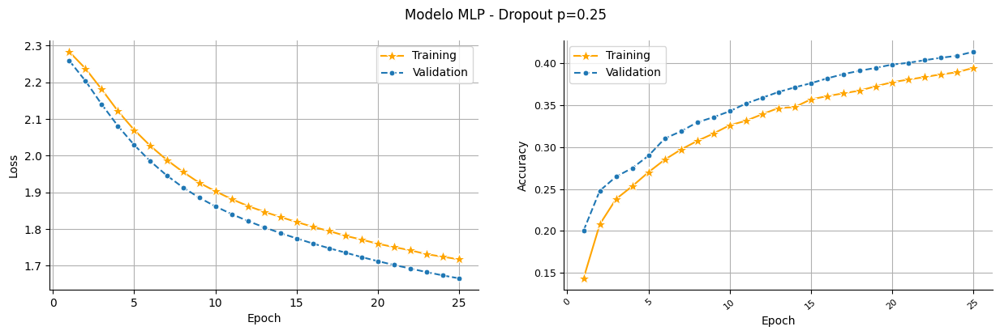

In [ ]:
title = 'Modelo MLP - Dropout p=0.25'
plot_loss(dropout_experiments[0]['register_performance'], title=title)

0
1


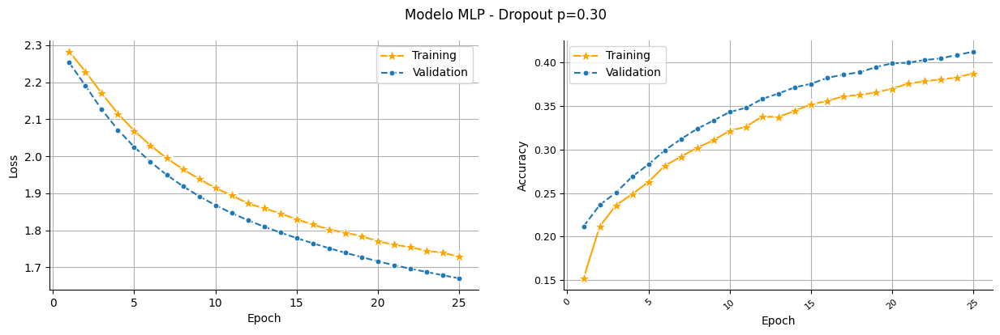

In [ ]:
title = 'Modelo MLP - Dropout p=0.30'
plot_loss(dropout_experiments[1]['register_performance'], title=title)

0
1


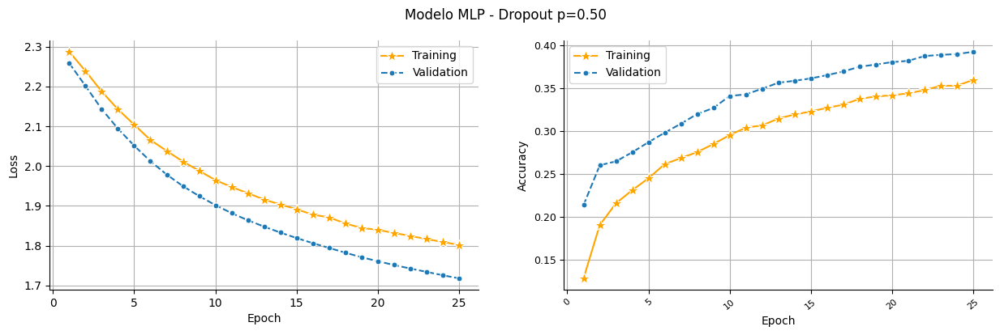

In [ ]:
title = 'Modelo MLP - Dropout p=0.50'
plot_loss(dropout_experiments[2]['register_performance'], title=title)

0
1


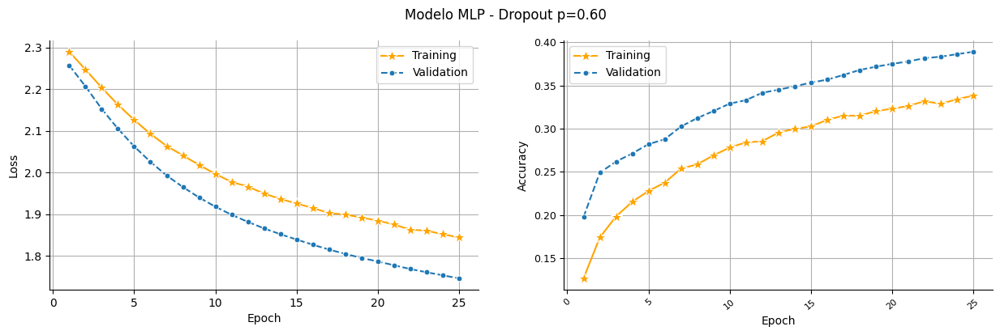

In [ ]:
title = 'Modelo MLP - Dropout p=0.60'
plot_loss(dropout_experiments[3]['register_performance'], title=title)

In [ ]:
# Aplica la técnica del dropout a un modelo que selecciones para mejorar el desempeño






## Batch Size

Uno de los hiperparámetros más importantes de una red es el tamaño del batch. Este determina:
* La cantidad de memoria que requiere el modelo para entrenarse.
    - Si ocurre un error OOM (out of memory), se puede reducir el tamaño del batch.
* El tiempo de entrenamiento.
    - Si se utiliza un GPU, todos los elementos del batch son procesados en paralelo. Adicionalmente, el paso de cómputo del CPU al GPU consume recursos. Por lo tanto, si el batch size es grande, hay menos batches por época, mayor paralelismo y menos cambios de dispositivo.
* La "suavidad" de las actualizaciones de los pesos.
    - La dirección de los gradientes utilizada en cada actualización se calcula en base al promedio de los errores del batch.
    - Si el batch es muy pequeño y el conjunto de datos no es suave, los gradientes pueden ser muy erráticos.


Veamos cómo se comporta el accuracy de una red con diferentes tamaños de lote, a lo largo de las etapas de entrenamiento:

<img width=600 src="https://androidkt.com/wp-content/uploads/2022/07/keras-batch-size.png" alt="Batch Size" title="Batch Size"/>

Los gráficos muestran que los lotes pequeños generalmente dan como resultado un aprendizaje rápido, pero un proceso de aprendizaje volátil con una mayor variación en la precisión de la clasificación. Los tamaños de lote más grandes ralentizan el proceso de aprendizaje, pero las etapas finales dan como resultado una convergencia hacia un modelo más estable, ejemplificado por una menor variación en la precisión de la clasificación.


In [ ]:
# TODO. Ejercicio: explorar distintos tamaños de batch para cada modelo.





## Batch Normalization

- En general, para acelerar la convergencia de la red, se normalizan los features de entrada, de manera que todos estén en un rango similar.
- Esta idea también puede llevarse a las capas ocultas de la red.
- La idea de la "Normalización por Lotes" (*Batch Normalization*) es reducir el rango en el que se mueven los valores de las neuronas ocultas.
- La manera en que se hace esto es restarle, a cada salida de cada capa oculta, la media del lote (batch) de datos de entrenamiento y dividirlo por la desviación estándar (a grandes razgos).
- Como resultado, la red converge más rápido e incluso se genera un efecto de regularización.


### Batch Normalization con PyTorch

- Se aplica agregando capas al modelo.
- Se llaman capas [`BatchNorm*`](https://pytorch.org/docs/stable/nn.html#normalization-layers), donde `*` se reemplaza por las dimensiones de entrada (`1d`, `2d`, `3d`) y se agrega a cada capa que se quiere normalizar.
- El `momentum` es un parámetro que decide cuánta información de los lotes anteriores se tiene en cuenta a la hora de normalizar el lote actual (en el trabajo original de *Batch Normalization*, este es de `0`).

In [ ]:
model = nn.Sequential(
    nn.Linear(32 * 32 * 3, 512),
    nn.BatchNorm1d(512, momentum=0.1),
    nn.ReLU(),
    nn.Dropout(p=0.3),
    nn.Linear(512, 10)
)

## Let's improve MLP

In [ ]:
trainset.class_to_idx

{'airplane': 0,
 'automobile': 1,
 'bird': 2,
 'cat': 3,
 'deer': 4,
 'dog': 5,
 'frog': 6,
 'horse': 7,
 'ship': 8,
 'truck': 9}

In [ ]:
trainset.transform # = transform
# testset.transform = transform

Compose(
    ToTensor()
    Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
)

In [ ]:
EPOCHS = 60
lr = 0.001
momentum = 0.9
BATCH_SIZE = 128
weight_decay = 0.001
p_dropout = 0.5
# Prepare the data
new_trainset, new_trainloader, new_testset, new_testloader = data_preparation(BATCH_SIZE, transform)
model = MLP_withDropout(n_inputs, n_outputs, n_hidden, activation_functions['ReLU'], p_dropout=p_dropout)  # It's important to re-define the model to avoid keep training an earlier version
print(f"\nExploring weight decay = {weight_decay} \nModel: {model}")
optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
experiment_best_MLP1 = run_experiment(model, EPOCHS, new_trainloader, new_testloader, loss_function, optimizer)

Files already downloaded and verified
Files already downloaded and verified

Exploring weight decay = 0.001 
Model: MLP_withDropout(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
)
Begin training...


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.197, Validation accuracy=0.286


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.272, Validation accuracy=0.336


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.308, Validation accuracy=0.366


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.330, Validation accuracy=0.385


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.347, Validation accuracy=0.399


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.361, Validation accuracy=0.408


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.369, Validation accuracy=0.418


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.377, Validation accuracy=0.426


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.385, Validation accuracy=0.432


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.393, Validation accuracy=0.437


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.401, Validation accuracy=0.445


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.403, Validation accuracy=0.451


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.412, Validation accuracy=0.452


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.418, Validation accuracy=0.460


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.421, Validation accuracy=0.462


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.423, Validation accuracy=0.466


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.429, Validation accuracy=0.470


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.434, Validation accuracy=0.473


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.434, Validation accuracy=0.476


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.439, Validation accuracy=0.479


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.446, Validation accuracy=0.483


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.447, Validation accuracy=0.487


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.451, Validation accuracy=0.490


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.453, Validation accuracy=0.495


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.457, Validation accuracy=0.495


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.461, Validation accuracy=0.503


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.462, Validation accuracy=0.498


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.465, Validation accuracy=0.506


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.469, Validation accuracy=0.503


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.469, Validation accuracy=0.508


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.474, Validation accuracy=0.510


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.474, Validation accuracy=0.513


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.478, Validation accuracy=0.514


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.480, Validation accuracy=0.512


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.482, Validation accuracy=0.514


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.486, Validation accuracy=0.519


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.487, Validation accuracy=0.518


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.493, Validation accuracy=0.514


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.492, Validation accuracy=0.518


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.494, Validation accuracy=0.520


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.495, Validation accuracy=0.523


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.495, Validation accuracy=0.521


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.501, Validation accuracy=0.523


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.502, Validation accuracy=0.525


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.503, Validation accuracy=0.525


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.505, Validation accuracy=0.525


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.503, Validation accuracy=0.529


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.508, Validation accuracy=0.529


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.509, Validation accuracy=0.532


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.512, Validation accuracy=0.532


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.516, Validation accuracy=0.532


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.515, Validation accuracy=0.533


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.516, Validation accuracy=0.535


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.517, Validation accuracy=0.534


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.516, Validation accuracy=0.535


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.520, Validation accuracy=0.537


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.518, Validation accuracy=0.534


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.525, Validation accuracy=0.538


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.528, Validation accuracy=0.540


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.523, Validation accuracy=0.544
Training finished!
Completed training in 60 batch:  
	-Training Loss:  1.3468 - Validation Loss:  1.31 
	- Training Accuracy:  0.52276 - Validation Accuracy:  0.5445 - Validation F1:  0.5396


0
1


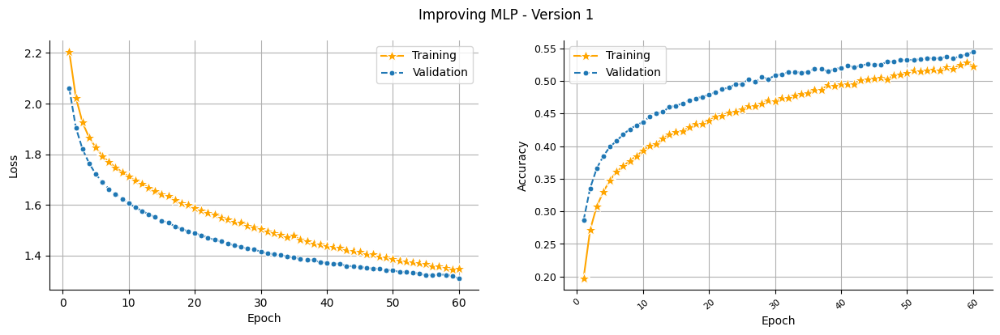

In [ ]:
title = 'Improving MLP - Version 1'
plot_loss(experiment_best_MLP1['register_performance'], title=title)

In [ ]:
lr = 0.001
momentum = 0.9
weight_decay = 0.001
p_dropout = 0.25
model = MLP_withDropout(n_inputs, n_outputs, n_hidden, activation_functions['ReLU'], p_dropout=p_dropout)  # It's important to re-define the model to avoid keep training an earlier version
print(f"\nExploring weight decay = {weight_decay} \nModel: {model}")
optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
experiment_best_MLP2 = run_experiment(model, EPOCHS, new_trainloader, new_testloader, loss_function, optimizer)


Exploring weight decay = 0.001 
Model: MLP_withDropout(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
  (dropout): Dropout(p=0.25, inplace=False)
)
Begin training...


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.219, Validation accuracy=0.280


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.298, Validation accuracy=0.340


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.336, Validation accuracy=0.372


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.361, Validation accuracy=0.393


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.379, Validation accuracy=0.407


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.392, Validation accuracy=0.420


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.405, Validation accuracy=0.431


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.412, Validation accuracy=0.440


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.424, Validation accuracy=0.447


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.431, Validation accuracy=0.453


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.439, Validation accuracy=0.461


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.447, Validation accuracy=0.465


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.452, Validation accuracy=0.470


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.459, Validation accuracy=0.478


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.466, Validation accuracy=0.482


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.471, Validation accuracy=0.487


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.475, Validation accuracy=0.491


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.480, Validation accuracy=0.495


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.485, Validation accuracy=0.502


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.489, Validation accuracy=0.502


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.494, Validation accuracy=0.503


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.499, Validation accuracy=0.510


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.504, Validation accuracy=0.512


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.506, Validation accuracy=0.515


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.513, Validation accuracy=0.517


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.514, Validation accuracy=0.521


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.520, Validation accuracy=0.523


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.524, Validation accuracy=0.525


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.528, Validation accuracy=0.530


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.529, Validation accuracy=0.530


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.535, Validation accuracy=0.531


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.538, Validation accuracy=0.532


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.541, Validation accuracy=0.533


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.539, Validation accuracy=0.533


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.544, Validation accuracy=0.539


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.547, Validation accuracy=0.537


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.553, Validation accuracy=0.534


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.556, Validation accuracy=0.536


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.558, Validation accuracy=0.541


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.563, Validation accuracy=0.543


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.563, Validation accuracy=0.546


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.569, Validation accuracy=0.547


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.569, Validation accuracy=0.544


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.572, Validation accuracy=0.544


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.575, Validation accuracy=0.548


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.578, Validation accuracy=0.550


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.577, Validation accuracy=0.548


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.581, Validation accuracy=0.550


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.584, Validation accuracy=0.554


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.588, Validation accuracy=0.553


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.591, Validation accuracy=0.551


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.590, Validation accuracy=0.552


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.594, Validation accuracy=0.554


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.596, Validation accuracy=0.554


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.598, Validation accuracy=0.555


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.602, Validation accuracy=0.553


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.603, Validation accuracy=0.552


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.603, Validation accuracy=0.558


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.608, Validation accuracy=0.558


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.610, Validation accuracy=0.557
Training finished!
Completed training in 60 batch:  
	-Training Loss:  1.1152 - Validation Loss:  1.2604 
	- Training Accuracy:  0.61018 - Validation Accuracy:  0.5566 - Validation F1:  0.553


0
1


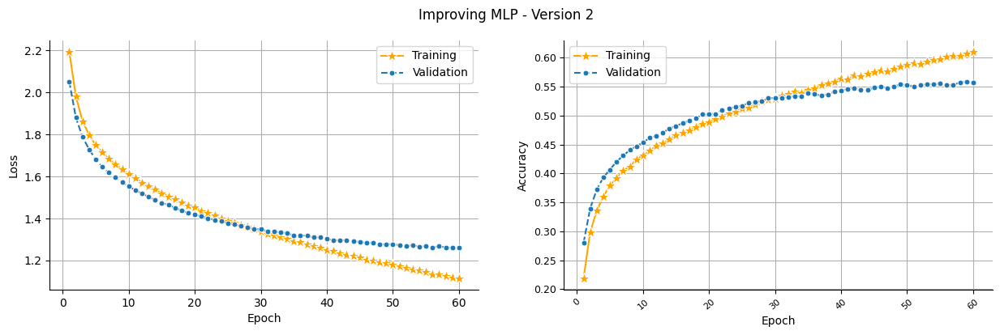

In [ ]:
title = 'Improving MLP - Version 2'
plot_loss(experiment_best_MLP2['register_performance'], title=title)

In [ ]:
EPOCHS = 60
lr = 0.001
momentum = 0.9
BATCH_SIZE = 128
weight_decay = 0.001
p_dropout = 0.5
# Prepare the data
trainset, trainloader, testset, testloader = data_preparation(BATCH_SIZE, transform)
model = MLP_withDropout(n_inputs, n_outputs, n_hidden, activation_functions['ReLU'], p_dropout=p_dropout)  # It's important to re-define the model to avoid keep training an earlier version
print(f"\nExploring weight decay = {weight_decay} \nModel: {model}")
optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
experiment_best_MLP = run_experiment(model, EPOCHS, trainloader, testloader, loss_function, optimizer)

Files already downloaded and verified
Files already downloaded and verified

Exploring weight decay = 0.001 
Model: MLP_withDropout(
  (hidden_layer1): Linear(in_features=3072, out_features=256, bias=True)
  (hidden_layer2): Linear(in_features=256, out_features=128, bias=True)
  (output_layer): Linear(in_features=128, out_features=10, bias=True)
  (activation_function): ReLU()
  (dropout): Dropout(p=0.5, inplace=False)
)
Begin training...


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.198, Validation accuracy=0.298


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.277, Validation accuracy=0.338


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.311, Validation accuracy=0.364


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.337, Validation accuracy=0.385


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.349, Validation accuracy=0.398


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.363, Validation accuracy=0.410


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.370, Validation accuracy=0.418


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.379, Validation accuracy=0.423


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.388, Validation accuracy=0.433


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.393, Validation accuracy=0.440


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.400, Validation accuracy=0.444


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.408, Validation accuracy=0.452


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.415, Validation accuracy=0.456


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.418, Validation accuracy=0.457


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.422, Validation accuracy=0.465


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.425, Validation accuracy=0.470


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.426, Validation accuracy=0.473


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.433, Validation accuracy=0.471


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.437, Validation accuracy=0.476


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.442, Validation accuracy=0.482


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.444, Validation accuracy=0.483


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.447, Validation accuracy=0.484


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.451, Validation accuracy=0.489


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.457, Validation accuracy=0.495


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.456, Validation accuracy=0.495


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.458, Validation accuracy=0.498


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.467, Validation accuracy=0.501


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.468, Validation accuracy=0.502


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.471, Validation accuracy=0.506


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.471, Validation accuracy=0.506


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.475, Validation accuracy=0.508


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.476, Validation accuracy=0.507


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.476, Validation accuracy=0.510


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.483, Validation accuracy=0.509


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.485, Validation accuracy=0.515


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.486, Validation accuracy=0.512


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.489, Validation accuracy=0.516


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.488, Validation accuracy=0.519


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.489, Validation accuracy=0.521


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.495, Validation accuracy=0.519


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.498, Validation accuracy=0.520


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.496, Validation accuracy=0.523


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.499, Validation accuracy=0.525


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.503, Validation accuracy=0.527


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.505, Validation accuracy=0.525


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.503, Validation accuracy=0.528


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.507, Validation accuracy=0.528


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.510, Validation accuracy=0.533


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.510, Validation accuracy=0.529


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.511, Validation accuracy=0.532


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.510, Validation accuracy=0.534


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.512, Validation accuracy=0.532


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.514, Validation accuracy=0.534


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.519, Validation accuracy=0.534


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.519, Validation accuracy=0.533


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.522, Validation accuracy=0.534


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.523, Validation accuracy=0.533


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.525, Validation accuracy=0.536


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.525, Validation accuracy=0.534


  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/79 [00:00<?, ?it/s]

	Train accuracy=0.529, Validation accuracy=0.536
Training finished!
Completed training in 60 batch:  
	-Training Loss:  1.3416 - Validation Loss:  1.3145 
	- Training Accuracy:  0.52934 - Validation Accuracy:  0.5361 - Validation F1:  0.5295


In [ ]:
title = 'Modelo Baseline - Best MLP'
plot_loss(experiment_best_MLP['register_performance'], title=title)

## Referencias

- [1] LeCun, Yann, Bengio, Yoshua, and Hinton, Geoffrey. "Deep learning." Nature 521, no. 7553 (2015): 436-444.
- [2] "Differences between L1 and L2 as Loss Function and Regularization". http://www.chioka.in/differences-between-l1-and-l2-as-loss-function-and-regularization/
- [3] Srivastava, Nitish, Geoffrey E. Hinton, Alex Krizhevsky, Ilya Sutskever, and Ruslan Salakhutdinov. "Dropout: a simple way to prevent neural networks from overfitting." Journal of machine learning research 15, no. 1 (2014): 1929-1958. Harvard.
- [4] Ioffe, S., & Szegedy, C. (2015). Batch normalization: Accelerating deep network training by reducing internal covariate shift. arXiv preprint arXiv:1502.03167.